# Langevin Dynamics Part 1: Walking on a Müller-Brown Potential
Written by Gianmarc Grazioli, Ph.D. <br> June 4, 2020
### Before we get started
This Jupyter notebook contains simulation data and data visualizations that take some time to run (about 6 minutes on my 3 year old laptop). Before you begin reading below, I recommend that you click _Cell > Run All_ in the dropdown menu above, as this will load all of the data necessary to see the data visualizations in this notebook. As is, this notebook is set up to reload previously generated data to save time. If you are interested in running new simulations with different parameters, you can later change the _runFresh_ variable in the first code cell below to __True__.

### What are Langevin Dynamics? 

According to Wikipedia, "In physics, Langevin dynamics is an approach to the mathematical modeling of the dynamics of molecular systems. It was originally developed by French physicist Paul Langevin. The approach is characterized by the use of simplified models while accounting for omitted degrees of freedom by the use of stochastic differential equations." https://en.wikipedia.org/wiki/Langevin_dynamics

To give an example, let's say that we want to simulate some protein in a way that captures the way it moves in it's native aqueuous environment and we have no interest in later analyzing how the water molecules are moving. One approach would be to directly simulate a large number of water molecules interacting with the protein _and_ the protein. This is a commonly used approach, but it does require us to spend a substantial amount of computing resources simulating motions of individual water molecules that do not interest us. What if we could take the system we care about, in this case the protein, and approximate the net effects of it interacting with water without having to explicitly simulate thousands of water molecules? This is the motivation behind Langevin dynamics!

Let's first take a look at the mathematics driving Langevin dynamics, and then we'll try applying it. Before we get into Langevin dynamics, we recall Newton's second law of motion, force equals mass times acceleration:

## $F = ma$

or since acceleration is the second derivative of position with respect to time (with M being a vector that stores all the masses of the particles in our system and X the vector of all positions of all the particles in our system):

## $F = M\ddot{X}$

Now we can look at the Langevin equation:

## $M\ddot{X} = -\nabla U(X) - \gamma\dot{X} + \sqrt{2\gamma k_{B}T}R(t)$

Ok, that was probably a big jump! But let's look at each term separately. On the left is just the total force on the system, as Newton had already told us this, so this must mean that all the stuff on the right just adds up to the total force on our system. In fact this is the case, so let's look at each term on the right individually. If you recall Hook's law describing the force exerted by a spring: 

## $F = -kx$

where _k_ is the spring constant (the larger the magnitude the stiffer the spring) and _x_ is the distance the spring is stretched or compressed, and also the accompanying law for the potential energy due to stretching or compressing a spring:

## $U(x) = \frac{1}{2}kx^2$

We note that if we take the derivative of the potential energy function and multiply it by -1, we get the force law! This is a general principle known as a conservative force. So returning to the first term on the right side of the Langevin equation we see this same principle because the $\nabla$ (called nabla) is a symbol that tells us to take the derivative of U(X) for all particles. If you imagine a model of a molecule where the atoms are balls and the bonds are springs, you can get an intuitive feel for how the $-\nabla U(X)$ term simply returns all the forces on the atoms in our system of interest due to interactions with eachother.  

Now let's examine the second term on the right side of the Langevin equation. Here we have $-\gamma\dot{X}$, where $\gamma$ is the viscosity of the solvent environment (water in our example) and $\dot{X}$ is the time derivative of position, also known as velocity. Let's think about what this term means: there is an opposing force that pushes in the opposite direction to the direction of motion, and the faster we go the more it resists us. A common example of a dissipative force like this is air resistance. It always pushes opposite the direction we're moving and it gets stronger the faster we go (e.g. moving your hand through the air while walking vs. holding it out the window of a  car moving at 60 miles per hour). So $-\gamma\dot{X}$ approximates the net effect of collisions with individual water molecules impeding motion as an opposing force proportional to velocity. 

The third term of the Langevin equation, $\sqrt{2\gamma k_{B}T}R(t)$ is a second solvent effect, this time the effect of solvent molecules crashing into the system of interest. Since you are a macroscopic being, you might think that the force due to stray water molecules bumping into you is something you could ignore, but imagine if you were as small as a typical protein molecule. Let's think about it on the macroscopic scale in which we live. The mass of a molecule of ubiquitin (a common protein) compared to the mass of a water molecule is proportional to my mass vs. the mass of an orange. Now bear in mind that the water molecules in a glass of room temperature water are moving around at hundreds of miles per hour (https://en.wikipedia.org/wiki/Thermal_velocity). So hopefully you can appreciate that simulations of proteins can't ignore getting knocked around by water molecules any more readily than I could ignore being pelted with oranges being launched at me at hundreds of miles per hour! If this sounds far fetched, take a look at the video below of pollen grains getting beat up by water under a microscope, and bear in mind that pollen grains are about 1000 times larger than a ubiquitin molecule!

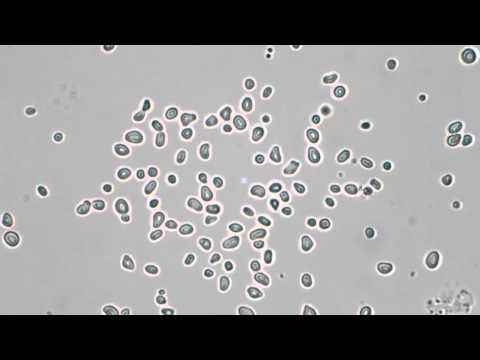

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('R5t-oA796to', width=600, height=300, start=11)

__Video 1__: A video of Brownian motion, an example of Langevin dynamics, being observed experimentally by looking at pollen grains in water under a microscople.

Now that you have a feel for why we need to account for forces due to our system being knocked around by water molecules when we simulate the dynamics of a protein, let's dive a bit deeper into the third term of the Langevin equation, $\sqrt{2\gamma k_{B}T}R(t)$. First, we note that $k_B$ (Boltzmann's constant), $T$ (temperature), and $\gamma$ (the viscosity constant we learned about above) are all constants, so this term is some constant multiplied by $R(t)$. So what is $R(t)$? The function $R(t)$ is a __stochastic function__ that returns uncorrelated random numbers from a __Gaussian distribution__ of mean 0 and standard deviation 1. Essentially, random "kicks" to the system are drawn from the standard Gaussian (aka __normal distribution__) and multiplied by a constant that grows as temperature increases. So the more we increase the temperature, the harder the system gets randomly kicked around. Revisiting the pollen grains in the water above, the idea is analogous to, instead of directly simulating a large number of water molecules bouncing off of the pollen grains, we simply define a function that applies random kicking forces to each pollen grain.

### The Müller-Brown Potential
Langevin dynamics is a widely used technique that has been implemented into powerful software packages like NAMD, Amber, and LAMMPS, which are capable of routinely simulating molecular systems involving hundreds of thousands of atoms. Before we concern ourselves with systems possessing hundreds of thousands of degrees of freedom or more, we will consider a much simpler system with only two spatial dimensions, the __Müller-Brown__ potential. This "simple" two dimensional potential is represented by the following equation for potential energy as a function of position in the _x_ and _y_ dimensions (_U(x, y)_):

\begin{equation}
\begin{split}
U(x, y) &= -170 \exp \left(11 (x+0.5) (y-1.5)-6.5 (x+0.5)^2-6.5 (y-1.5)^2\right)\\
            &   +15 \exp \left(0.6 (x+1) (y-1)+0.7(x+1)^2+0.7 (y-1)^2\right)\\
            &   -100 e^{-x^2-10 (y-0.5)^2}-200 e^{-(x-1)^2-10 y^2}\\
\end{split}
\end{equation}

So that's what the equation looks like, but the best way to get some intution for it is to look at a plot of the potential. Video 2, shown below, is one way to visualize a Müller-Brown potential. 

In [2]:
%%HTML
<div align="middle">
<video width="80%" controls>
      <source src="mullerBrownQuickMovie.mp4" type="video/mp4">
</video></div>

__Video 2:__ Here we have a data visualization of a Müller-Brown potential that I created using a combination of Python and Pymol. 

If you imagine that you are randomly kicking a soccer ball on the surface inside the basin-like structure in the video, you can get a sense of what it is to simulate a 2D particle moving around on a Müller-Brown potential. Note that if you gave the ball a kick and let it roll around until it came to rest, there are three stable regions where the ball could potentially come to rest. The stable regions are particularly apparent looking at the initial view, as there are clearly 3 separate sub-basins within the larger basin created by the potential. Thanks to these features, the fact that there are only two spatial dimensions (it can be plotted with energy as the 3rd dimension), and the nature of the many exponential functions that comprise it, the Müller-Brown potential has become a well-established benchmark for testing molecular simulation methodologies. It's also great for someone who wants to learn what's going on "under the hood" of a molecular dynamics simulation!

### Simulating Trajectories on a Müller-Brown Potential
Now that we have an idea of what Langevin dynamics and the Müller-Brown potential are, let's put the two together and start running simulations! The code cell below imports all the necessary libraries, the actual Langevin code (langevin_2D.py), and defines all the variables that go into this simulation. If you would like to run a new simulation with different parameters, there are a couple things to keep in mind. The first is that these parameters were subjected to some substantial tweaking in order to produce trajectories that converge to the desired temperature (more on that to come) in a reasonable amount of simulation time. Trying parameters that "break" the code in some way can actually be a good way to learn, but be forewarned that this can happen. The other thing to note is that there is a Boolean variable called _runFresh_ that controls whether this notebook is carried out using previously generated data (False) or with a newly run trajectory (True). Be sure to change it to True if you want to change parameters in the dictionary called _param_ (otherwise the code will ignore your new parameters). 

In [3]:
import numpy as np
import matplotlib.pylab as plt 
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import langevin_2D as langevin
import writeXYZ as xyz
import plottingFunctions as myPlt
import pickle
import timeit

runFresh = False # Run a new trajectory?

In [4]:
start_time = timeit.default_timer()

trajectoryFileName = "oldTrajectory.pickle"

params = {
        'natoms': 40, #how many particles we want
        'temp': .15, #temperature, .5 works well, too hot makes Müller-Brown unstable! was .25
        'mass': 0.001, #mass of the particle, was .001
        'atomType': "H", #type of atom for xyz file
        'relax': .5e-13, #dissipation constant for thermostat, .5e-13 works well
        'dt': 1.25e-17, # 1e-15 is too large, 
        'steps': 20000, #number of steps to run
        'freq': 50, #frequency to save positions
        'box': ((-1.7, 1.2), (-.7, 2.2)), #bounds in x and y direction
        'initPos': (-.75, .6), #initial position to center cloud of particles
        }

if runFresh:
    %matplotlib inline
    trajectory = langevin.run(**params)
    with open(trajectoryFileName, 'wb') as oldTrajectory:
        pickle.dump(trajectory, oldTrajectory)
else:
    with open(trajectoryFileName, 'rb') as oldTrajectory:
        trajectory = pickle.load(oldTrajectory)
    

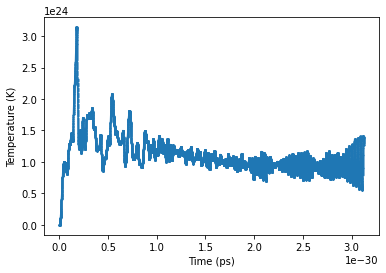

In [5]:
myPlt.plotTemperatures("temperatures.txt", params['dt'])

_Figure 1:_ This plot shows simulation temperature as a function of time. Note that the simulation has converged to the temperature defined in the simulation (as long as you're running with the original set of parameters).

### Analyzing the Simulation Results
#### Temperature
The first thing we note is the temperature of the simulation changing as a function of time depicted in Figure 1 above. Note how the temperature begins at zero, spikes at around 2.8 K, then decays down to the specified temperature of .5 K. Remember that the velocity at which atoms are moving and the temperature of the system they comprise are related (faster particles mean higher temperatures). Given the initial position of the trajectories in the simulation, can you explain why the temperature exhibits the behvior shown in Figure 1? Molecular simulations with thousands of atoms also always require some time to equilibrate to the defined temperature as well. Molecules such as proteins and nucleic acids, some of the most common molecular systems studied using molecular dynamics, also often have multiple regions in their energetic "landscapes" (i.e. potential energy surfaces). What complicates matters for those systems is that, instead of two spatial dimensions _x_ and _y_ with complex exponential relationships, we have hundreds of thousands of dimensions to worry about! Hopefully this illustrates why the Müller-Brown potential is such a valuable test system for validating molecular simulation methods before applying them to even small molecular systems. Even alanine dipeptide, the smallest protein-like molecule frequently used later in the molecular dynamics methods development process, has $22$ atoms, yielding $3 \times 22 - 6 = 60$ spatial dimensions!

#### Plotting the Trajectories 
Now let's have some fun with the trajectories! We note from the _param_ Python dictionary above that there are 100 particles (_natoms_ = 100) undergoing Langevin dynamics on the Müller-Brown potential. Click play on the display below, and you can watch the trajectory evolve in time. Note that the trajectories are initiated on "higher ground," energetically speaking, and eventually find their way to the 3 minima, where they become trapped. Many of the principles that you can observe and gain intuition for visually using the Müller-Brown potential can be directly applied to far more complex molecular systems. Think about how the temperature of the system changes as a function of time compared to the motions of the particles. Consider chemical concepts like transition states and activation energies and compare them to the "hills" the trajectories must climb to move between local minima.



In [6]:
%%capture
if runFresh:
    cartoon = myPlt.getTrajMovie(trajectory, params['box'])

### An Animation of our Langevin Trajectories on Müller-Brown Potential
Here we show the results of running Langevin dynamics on a Müller-Brown potential. If you want to run a fresh trajectory and/or change the simulation parameters, be sure to set runFresh = True.
![SegmentLocal](traj.gif "segment")

__Video 3:__ An animated data visualization showing 40 trajectories undergoing Langevin dynamics on a Müller-Brown potential represented by a contour plot. 
#### Please Note:
You can watch this same animation in a format where you can control playback at the bottom of this Jupyter notebook.

#### The cell below is used to create .xyz files:

In [7]:
myPlt.writeTrajXYZ(trajectory, 'traj-hydrogen-3D.xyz')
myPlt.getSurfaceForPymol(params['box'], 100, 100, 'surface.xyz')

You may have noticed that, in addition to plotting results for the simulation in this Jupyter notebook, the results were also exported in two different formats. One of the files exported by the function _langevin.getMovie()_ (called in the cell below) is the file _traj.gif_. While it's probably not a very meme-worthy GIF, it does share the same functionality as the GIFs you might share on social media, in that you can open it in your favorite browser and play it like a movie. There are also a few other output files that are generated by langevin_2D.py: _surface.xyz_, _traj-hydrogen-3D.xyz_, and _temperatures.txt_. The file _temperatures.txt_ is a plain text file that contains the temperature at each timestep throughout the simulation, which is later loaded back into Python for plotting purposes. The two files with _.xyz_ file extensions were created for the purpose of loading into molecular dynamics visualization software, such as Pymol or VMD. Shown below in __Video 4__ is a 3D rendering of these same trajectories, along with some very melodramatic commentary. What I have done here is not a typical use of Pymol, as I first outputted a grid of hydrogen atoms as they would lie on the Müller-Brown potential using the z-axis to represent the energy value. There is no reason to make them hydrogen atoms other than I had to trick Pymol into thinking they were some sort of atom! The trajectories were also outputted as hydrogen atoms for the same reason. Later, we're going to learn how to make videos like this using real molecules (melodramatic commentary will be optional).     

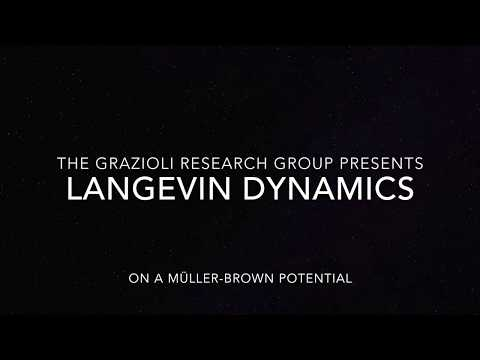

In [8]:
YouTubeVideo('BsEVmInG3Oo', width=600, height=300)

__Video 4:__ This video shows a fancier 3 dimensional animated data visualization showing 100 trajectories undergoing Langevin dynamics on a Müller-Brown potential. It's admittedly a bit melodramatic, but hopefully it's helpful for getting a feel for the dynamics. :-) 

# Homework:
1) Use the animation below to study how temperature varies depending on how the trajectories are moving. Remember that you can speed it up or slow it down with the + and - buttons, pause it anywhere, move one step at a time, etc. In your own words, explain what is happening as the system moves towards the equilibrium temperature.  

In [9]:
%%capture
tempWithTraj = myPlt.getMovieWithTemp(trajectory, params["box"], "temperatures.txt")

In [10]:
HTML(tempWithTraj.to_jshtml())

In [11]:
# Find out how long the notebook takes to run on your machine
# To give you an idea, my Macbook Pro from 2017 with a 2.3 GHz 
# Intel Core i5 processor and 8 GB of RAM takes about 6 minutes.
elapsed = timeit.default_timer() - start_time
print("This notebook ran in", "%.2f" % round(elapsed/60, 2),"minutes.")

This notebook ran in 0.51 minutes.
